# Exploratory data analysis for weather

* Read csv file into a data frame time series
* fill missing data
* create static plots with matplotlib
* create dynamic plots with hvplot

In [1]:
from utils_weather import *

%load_ext autoreload
%autoreload 2

# Read csv file

In [2]:
INPUT_FOLDER_NAME = "/Users/abuzatu/Work/data/weather"
INPUT_FILE_NAME = f"{INPUT_FOLDER_NAME}/weather.csv"

In [3]:
df = pd.read_csv(INPUT_FILE_NAME )
df

,datetime,temperature_actual,temperature_apparent,humidity,visibility,wind_speed,precipitation_type,precipitation_probability,precipitation_intensity
0,2019-03-18 19:05:04,3.78,-0.48,0.82,11.890,5.62,rain,0.03,0.0203
1,2019-03-18 20:05:04,4.21,-0.67,0.79,9.510,7.46,NaN,0.00,0.0000
2,2019-03-18 21:05:04,3.37,-1.52,0.83,9.450,6.84,NaN,0.00,0.0000
3,2019-03-18 22:05:04,3.38,-1.36,0.84,10.120,6.48,NaN,0.00,0.0000
4,2019-03-18 23:05:04,2.96,-1.70,0.87,10.110,6.00,NaN,0.00,0.0000
...,...,...,...,...,...,...,...,...,...
15964,2021-01-14 11:12:13,1.19,-3.05,0.87,16.093,4.34,snow,0.06,0.0112
15965,2021-01-14 12:12:04,1.65,-2.44,0.84,16.093,4.27,rain,0.01,0.0052
15966,2021-01-14 13:12:04,1.66,-2.55,0.85,16.093,4.47,rain,0.11,0.0163
15967,2021-01-14 14:12:06,1.53,-2.59,0.84,16.093,4.28,rain,0.09,0.0183


In [4]:
df.columns

Index(['datetime', 'temperature_actual', 'temperature_apparent', 'humidity',
       'visibility', 'wind_speed', 'precipitation_type',
       'precipitation_probability', 'precipitation_intensity'],
      dtype='object')

In [5]:
df.to_csv("/Users/abuzatu/Work/data/weather/weather.csv", index = False)

In [6]:
df.dtypes

datetime                      object
temperature_actual           float64
temperature_apparent         float64
humidity                     float64
visibility                   float64
wind_speed                   float64
precipitation_type            object
precipitation_probability    float64
precipitation_intensity      float64
dtype: object

# Convert to a time series

In [7]:
# convert datetime from string to pd.Timestamp
df["datetime"] = pd.to_datetime(df.datetime)
# set the index
df.set_index("datetime", inplace = True)
# sort chronologically by the index
df.sort_index(inplace = True)
df

,temperature_actual,temperature_apparent,humidity,visibility,wind_speed,precipitation_type,precipitation_probability,precipitation_intensity
datetime,,,,,,,,
2019-03-18 19:05:04,3.78,-0.48,0.82,11.890,5.62,rain,0.03,0.0203
2019-03-18 20:05:04,4.21,-0.67,0.79,9.510,7.46,NaN,0.00,0.0000
2019-03-18 21:05:04,3.37,-1.52,0.83,9.450,6.84,NaN,0.00,0.0000
2019-03-18 22:05:04,3.38,-1.36,0.84,10.120,6.48,NaN,0.00,0.0000
2019-03-18 23:05:04,2.96,-1.70,0.87,10.110,6.00,NaN,0.00,0.0000
...,...,...,...,...,...,...,...,...
2021-01-14 11:12:13,1.19,-3.05,0.87,16.093,4.34,snow,0.06,0.0112
2021-01-14 12:12:04,1.65,-2.44,0.84,16.093,4.27,rain,0.01,0.0052
2021-01-14 13:12:04,1.66,-2.55,0.85,16.093,4.47,rain,0.11,0.0163


In [8]:
df.dtypes

temperature_actual           float64
temperature_apparent         float64
humidity                     float64
visibility                   float64
wind_speed                   float64
precipitation_type            object
precipitation_probability    float64
precipitation_intensity      float64
dtype: object

# Check for missing values

In [9]:
check_df_for_null_values(df)

temperature_actual: filled=15969/15969, empty=0/15969.
temperature_apparent: filled=15969/15969, empty=0/15969.
humidity: filled=15969/15969, empty=0/15969.
visibility: filled=15969/15969, empty=0/15969.
wind_speed: filled=15969/15969, empty=0/15969.
precipitation_type: filled=7083/15969, empty=8886/15969.
precipitation_probability: filled=15969/15969, empty=0/15969.
precipitation_intensity: filled=15969/15969, empty=0/15969.


Precipitation type is missing in about half of the cases, but in all cases the precipitation_probability is zero and the precipitation_intensity is zero.

In [10]:
df2 = df[df.precipitation_type.isnull()]
df2

,temperature_actual,temperature_apparent,humidity,visibility,wind_speed,precipitation_type,precipitation_probability,precipitation_intensity
datetime,,,,,,,,
2019-03-18 20:05:04,4.21,-0.67,0.79,9.510,7.46,NaN,0.0,0.0
2019-03-18 21:05:04,3.37,-1.52,0.83,9.450,6.84,NaN,0.0,0.0
2019-03-18 22:05:04,3.38,-1.36,0.84,10.120,6.48,NaN,0.0,0.0
2019-03-18 23:05:04,2.96,-1.70,0.87,10.110,6.00,NaN,0.0,0.0
2019-03-19 00:05:04,3.46,-1.45,0.85,10.120,6.93,NaN,0.0,0.0
...,...,...,...,...,...,...,...,...
2021-01-10 22:12:05,-1.29,-5.58,0.81,16.093,3.61,NaN,0.0,0.0
2021-01-10 23:12:05,-0.98,-5.33,0.80,16.093,3.79,NaN,0.0,0.0
2021-01-11 00:12:05,-0.61,-4.93,0.79,16.093,3.85,NaN,0.0,0.0


In [11]:
df2.precipitation_probability.value_counts()

0.0    8886
Name: precipitation_probability, dtype: int64

In [12]:
df2.precipitation_intensity.value_counts()

0.0    8886
Name: precipitation_intensity, dtype: int64

Let's fill it however with the string "none"

In [13]:
df.loc[df.precipitation_type.isnull(), ["precipitation_type"]] = "none"
df

,temperature_actual,temperature_apparent,humidity,visibility,wind_speed,precipitation_type,precipitation_probability,precipitation_intensity
datetime,,,,,,,,
2019-03-18 19:05:04,3.78,-0.48,0.82,11.890,5.62,rain,0.03,0.0203
2019-03-18 20:05:04,4.21,-0.67,0.79,9.510,7.46,none,0.00,0.0000
2019-03-18 21:05:04,3.37,-1.52,0.83,9.450,6.84,none,0.00,0.0000
2019-03-18 22:05:04,3.38,-1.36,0.84,10.120,6.48,none,0.00,0.0000
2019-03-18 23:05:04,2.96,-1.70,0.87,10.110,6.00,none,0.00,0.0000
...,...,...,...,...,...,...,...,...
2021-01-14 11:12:13,1.19,-3.05,0.87,16.093,4.34,snow,0.06,0.0112
2021-01-14 12:12:04,1.65,-2.44,0.84,16.093,4.27,rain,0.01,0.0052
2021-01-14 13:12:04,1.66,-2.55,0.85,16.093,4.47,rain,0.11,0.0163


In [14]:
df.precipitation_type.value_counts()

none     8886
rain     6847
snow      235
sleet       1
Name: precipitation_type, dtype: int64

# Create static time series plots

## Temperature

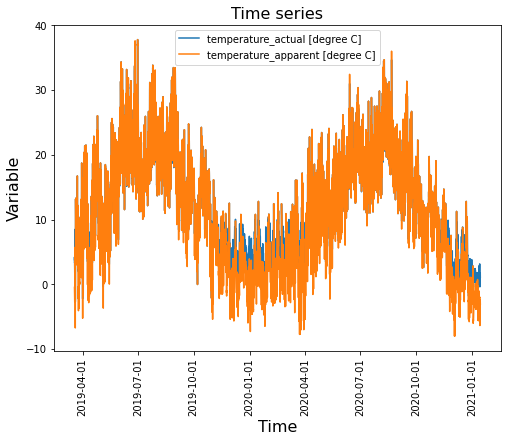

In [15]:
list_var_unit = [
    ("temperature_actual", "degree C"),
    ("temperature_apparent", "degree C"),
]
plot_static_line(df, list_var_unit)

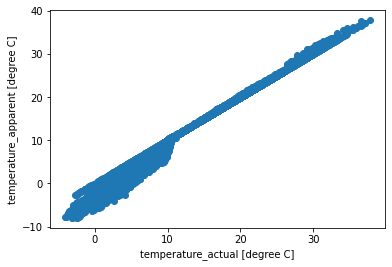

In [16]:
list_var_unit = [
    ("temperature_actual", "degree C"),
    ("temperature_apparent", "degree C"),
]
plot_static_scatter(df, list_var_unit)

In [17]:
df["temperature_apparent_actual"] = df.temperature_apparent - df.temperature_actual
df

,temperature_actual,temperature_apparent,humidity,visibility,wind_speed,precipitation_type,precipitation_probability,precipitation_intensity,temperature_apparent_actual
datetime,,,,,,,,,
2019-03-18 19:05:04,3.78,-0.48,0.82,11.890,5.62,rain,0.03,0.0203,-4.26
2019-03-18 20:05:04,4.21,-0.67,0.79,9.510,7.46,none,0.00,0.0000,-4.88
2019-03-18 21:05:04,3.37,-1.52,0.83,9.450,6.84,none,0.00,0.0000,-4.89
2019-03-18 22:05:04,3.38,-1.36,0.84,10.120,6.48,none,0.00,0.0000,-4.74
2019-03-18 23:05:04,2.96,-1.70,0.87,10.110,6.00,none,0.00,0.0000,-4.66
...,...,...,...,...,...,...,...,...,...
2021-01-14 11:12:13,1.19,-3.05,0.87,16.093,4.34,snow,0.06,0.0112,-4.24
2021-01-14 12:12:04,1.65,-2.44,0.84,16.093,4.27,rain,0.01,0.0052,-4.09
2021-01-14 13:12:04,1.66,-2.55,0.85,16.093,4.47,rain,0.11,0.0163,-4.21


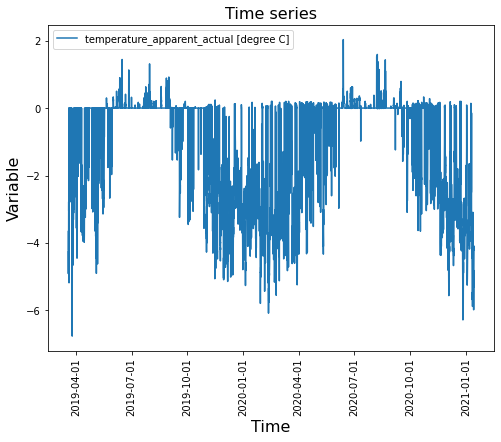

In [18]:
list_var_unit = [
    ("temperature_apparent_actual", "degree C"),
]
plot_static_line(df, list_var_unit)

Interpretation: in the cold season (Oct to Apr) it feels colder than it is outside between 2 to 6 degrees. But in the warm season it feels basically just as it is outside, maybe 0.2 degrees more. So it is worth investigating in your model if the actual temperature or the apparent temperature is the one that correlates the most with your target.

## Humidity

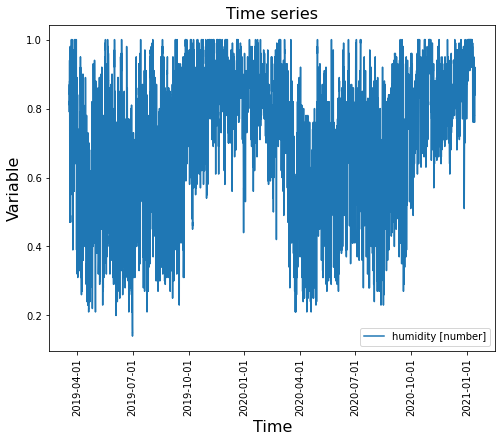

In [19]:
list_var_unit = [
    ("humidity", "number"),
]
plot_static_line(df, list_var_unit)

## Visibility

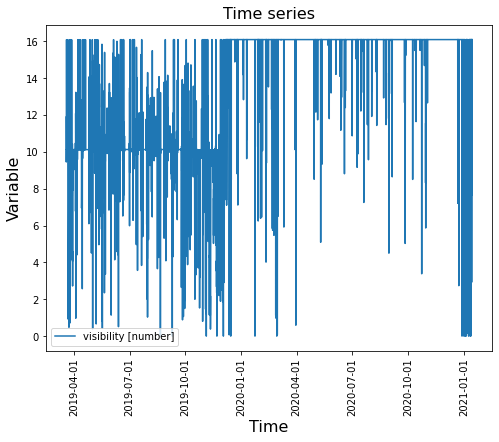

In [20]:
list_var_unit = [
    ("visibility", "number"),
]
plot_static_line(df, list_var_unit)

## Wind speed

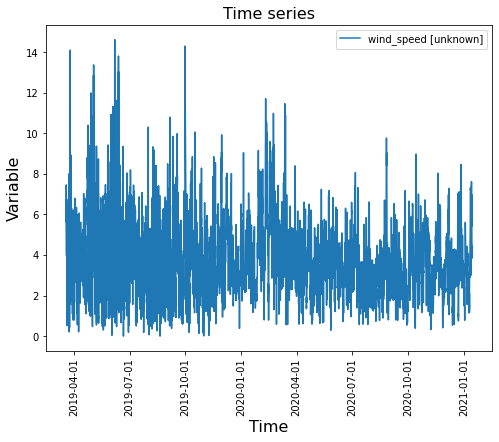

In [21]:
list_var_unit = [
    ("wind_speed", "unknown"),
]
plot_static_line(df, list_var_unit)

## Precipitation

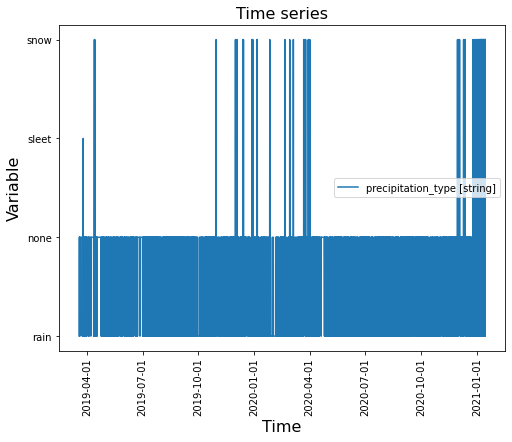

In [22]:
list_var_unit = [
    ("precipitation_type", "string"),
]
plot_static_line(df, list_var_unit)

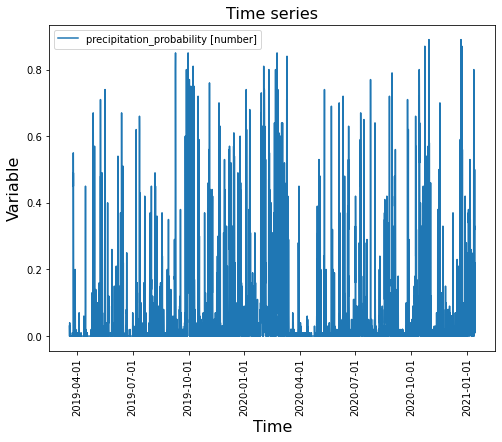

In [23]:
list_var_unit = [
    ("precipitation_probability", "number"),
]
plot_static_line(df, list_var_unit)

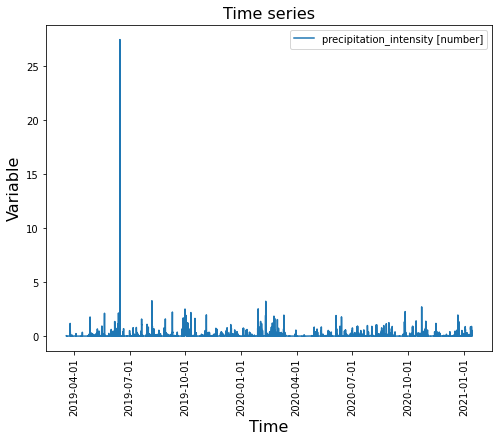

In [24]:
list_var_unit = [
    ("precipitation_intensity", "number"),
]
plot_static_line(df, list_var_unit)

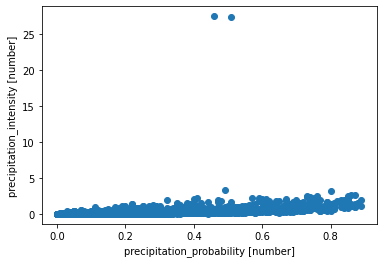

In [25]:
list_var_unit = [
    ("precipitation_probability", "number"),
    ("precipitation_intensity", "number"),
]
plot_static_scatter(df, list_var_unit)

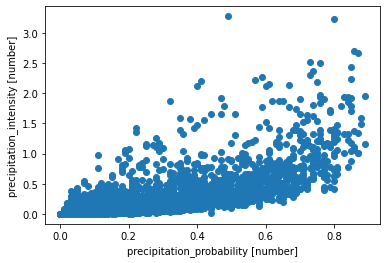

In [26]:
df2 = df[df.precipitation_intensity < 20]
list_var_unit = [
    ("precipitation_probability", "number"),
    ("precipitation_intensity", "number"),
]
plot_static_scatter(df2, list_var_unit)


# Create interactive plots

In [27]:
list_var_unit = [
    ("temperature_actual", "degree C"),
    ("temperature_apparent", "degree C"),
]
final_plot = plot_interactive_line(df, list_var_unit)
final_plot.opts(xaxis = "bottom", title = f"Interactive time series", show_legend = True)

:Overlay
   .Curve.I  :Curve   [datetime]   (temperature_actual,temperature_apparent,humidity,visibility,wind_speed,precipitation_type,precipitation_probability,precipitation_intensity,temperature_apparent_actual)
   .Curve.II :Curve   [datetime]   (temperature_apparent,temperature_actual,humidity,visibility,wind_speed,precipitation_type,precipitation_probability,precipitation_intensity,temperature_apparent_actual)

In [28]:
list_var_unit = [
    ("temperature_actual", "degree C"),
    ("temperature_apparent", "degree C"),
]
final_plot = plot_interactive_scatter(df, list_var_unit)
final_plot.opts(xaxis = "bottom")

:Scatter   [temperature_actual]   (temperature_apparent)

In [29]:
list_var_unit = [
    ("humidity", "number"),
]
plot_interactive_line(df, list_var_unit)

:Curve   [datetime]   (humidity,temperature_actual,temperature_apparent,visibility,wind_speed,precipitation_type,precipitation_probability,precipitation_intensity,temperature_apparent_actual)

In [30]:
list_var_unit = [
    ("visibility", "number"),
]
plot_interactive_line(df, list_var_unit)

:Curve   [datetime]   (visibility,temperature_actual,temperature_apparent,humidity,wind_speed,precipitation_type,precipitation_probability,precipitation_intensity,temperature_apparent_actual)

In [31]:
list_var_unit = [
    ("wind_speed", "number"),
]
plot_interactive_line(df, list_var_unit)

:Curve   [datetime]   (wind_speed,temperature_actual,temperature_apparent,humidity,visibility,precipitation_type,precipitation_probability,precipitation_intensity,temperature_apparent_actual)

In [32]:
list_var_unit = [
    ("precipitation_type", "string"),
]
plot_interactive_line(df, list_var_unit)

:Curve   [datetime]   (precipitation_type,temperature_actual,temperature_apparent,humidity,visibility,wind_speed,precipitation_probability,precipitation_intensity,temperature_apparent_actual)

In [33]:
list_var_unit = [
    ("precipitation_probability", "number"),
]
plot_interactive_line(df, list_var_unit)

:Curve   [datetime]   (precipitation_probability,temperature_actual,temperature_apparent,humidity,visibility,wind_speed,precipitation_type,precipitation_intensity,temperature_apparent_actual)

In [34]:
list_var_unit = [
    ("precipitation_intensity", "number"),
]
plot_interactive_line(df, list_var_unit)

:Curve   [datetime]   (precipitation_intensity,temperature_actual,temperature_apparent,humidity,visibility,wind_speed,precipitation_type,precipitation_probability,temperature_apparent_actual)

In [35]:
list_var_unit = [
    ("precipitation_probability", "number"),
    ("precipitation_intensity", "number"),
]
plot_interactive_scatter(df, list_var_unit)

:Scatter   [precipitation_probability]   (precipitation_intensity)